In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import svm

In [3]:
df=pd.read_csv('loan_approval_dataset.csv')

In [4]:
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4269 entries, 0 to 4268
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   loan_id                    4269 non-null   int64 
 1    no_of_dependents          4269 non-null   int64 
 2    education                 4269 non-null   object
 3    self_employed             4269 non-null   object
 4    income_annum              4269 non-null   int64 
 5    loan_amount               4269 non-null   int64 
 6    loan_term                 4269 non-null   int64 
 7    cibil_score               4269 non-null   int64 
 8    residential_assets_value  4269 non-null   int64 
 9    commercial_assets_value   4269 non-null   int64 
 10   luxury_assets_value       4269 non-null   int64 
 11   bank_asset_value          4269 non-null   int64 
 12   loan_status               4269 non-null   object
dtypes: int64(10), object(3)
memory usage: 433.7+ KB


In [6]:
df.isnull().sum()

loan_id                      0
 no_of_dependents            0
 education                   0
 self_employed               0
 income_annum                0
 loan_amount                 0
 loan_term                   0
 cibil_score                 0
 residential_assets_value    0
 commercial_assets_value     0
 luxury_assets_value         0
 bank_asset_value            0
 loan_status                 0
dtype: int64

<Axes: >

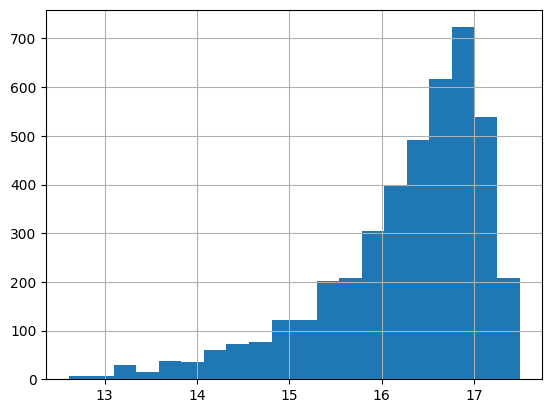

In [7]:
df['loan_amount_log']= np.log(df[' loan_amount'])
df['loan_amount_log'].hist(bins=20)

<Axes: >

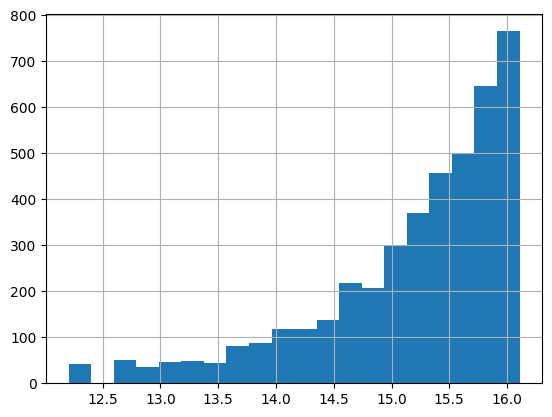

In [8]:
df['income_annum_log']= np.log(df[' income_annum'])
df['income_annum_log'].hist(bins=20)

In [9]:
df['Total_assets']=df[' residential_assets_value']+df[' commercial_assets_value']+df[' luxury_assets_value']+df[' bank_asset_value']

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4269 entries, 0 to 4268
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   loan_id                    4269 non-null   int64  
 1    no_of_dependents          4269 non-null   int64  
 2    education                 4269 non-null   object 
 3    self_employed             4269 non-null   object 
 4    income_annum              4269 non-null   int64  
 5    loan_amount               4269 non-null   int64  
 6    loan_term                 4269 non-null   int64  
 7    cibil_score               4269 non-null   int64  
 8    residential_assets_value  4269 non-null   int64  
 9    commercial_assets_value   4269 non-null   int64  
 10   luxury_assets_value       4269 non-null   int64  
 11   bank_asset_value          4269 non-null   int64  
 12   loan_status               4269 non-null   object 
 13  loan_amount_log            4269 non-null   float

In [11]:
def trimming(name):
    for i in range(0,4269):
        df[name][i]=df[name][i].lstrip()

In [12]:
trimming(' education')

C:\Users\User\AppData\Local\Temp\ipykernel_11736\4291800550.py:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[name][i]=df[name][i].lstrip()
C:\Users\User\AppData\Local\Temp\ipykernel_11736\4291800550.py:3: SettingWithCopyWarning: 
A val

In [13]:
for i in range(0,4269):
    if df[' education'][i] == 'Graduate':
        df[' education'][i]=1
    else:
        df[' education'][i]=0

C:\Users\User\AppData\Local\Temp\ipykernel_11736\3501097197.py:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[' education'][i]=1
C:\Users\User\AppData\Local\Temp\ipykernel_11736\3501097197.py:3: SettingWithCopyWarning: 
A value is tryin

In [14]:
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status,loan_amount_log,income_annum_log,Total_assets
0,1,2,1,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved,17.213369,16.077274,50700000
1,2,0,0,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected,16.316947,15.226498,17000000
2,3,3,1,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected,17.206658,16.023785,57700000
3,4,3,1,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected,17.239773,15.919645,52700000
4,5,5,0,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected,17.001863,16.097893,55000000


In [15]:
for i in range(0,4269):
    if df[' self_employed'][i] == ' Yes':
        df[' self_employed'][i]=1
    else:
        df[' self_employed'][i]=0

C:\Users\User\AppData\Local\Temp\ipykernel_11736\375772372.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[' self_employed'][i]=0
C:\Users\User\AppData\Local\Temp\ipykernel_11736\375772372.py:5: SettingWithCopyWarning: 
A value is try

In [16]:
for i in range(0,4269):
    if df[' loan_status'][i] == ' Approved':
        df[' loan_status'][i]=1
    else:
        df[' loan_status'][i]=0

C:\Users\User\AppData\Local\Temp\ipykernel_11736\265457705.py:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df[' loan_status'][i]=1
C:\Users\User\AppData\Local\Temp\ipykernel_11736\265457705.py:3: SettingWithCopyWarning: 
A value is tryin

In [17]:
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status,loan_amount_log,income_annum_log,Total_assets
0,1,2,1,0,9600000,29900000,12,778,2400000,17600000,22700000,8000000,1,17.213369,16.077274,50700000
1,2,0,0,1,4100000,12200000,8,417,2700000,2200000,8800000,3300000,0,16.316947,15.226498,17000000
2,3,3,1,0,9100000,29700000,20,506,7100000,4500000,33300000,12800000,0,17.206658,16.023785,57700000
3,4,3,1,0,8200000,30700000,8,467,18200000,3300000,23300000,7900000,0,17.239773,15.919645,52700000
4,5,5,0,1,9800000,24200000,20,382,12400000,8200000,29400000,5000000,0,17.001863,16.097893,55000000


In [18]:
df.corr()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status,loan_amount_log,income_annum_log,Total_assets
loan_id,1.000000,0.005326,0.015536,0.001745,0.012592,0.008170,0.009809,0.016323,0.020936,0.018595,-0.000862,0.010765,0.017685,0.013270,0.015871,0.012555
no_of_dependents,0.005326,1.000000,0.002697,0.000765,0.007266,-0.003366,-0.020111,-0.009998,0.007376,-0.001531,0.002817,0.011163,-0.018114,-0.001284,0.005605,0.005289
education,0.015536,0.002697,1.000000,-0.023224,0.011625,0.010631,-0.008417,-0.004649,0.010930,-0.006763,0.012471,0.009424,0.004918,0.010268,0.012093,0.009513
self_employed,0.001745,0.000765,-0.023224,1.000000,0.002368,0.001450,0.004107,-0.004866,0.006144,-0.017998,0.004413,-0.000215,0.000345,-0.005593,-0.005451,0.000023
income_annum,0.012592,0.007266,0.011625,0.002368,1.000000,0.927470,0.011488,-0.023034,0.636841,0.640328,0.929145,0.851093,-0.015189,0.884963,0.914188,0.931845
loan_amount,0.008170,-0.003366,0.010631,0.001450,0.927470,1.000000,0.008437,-0.017035,0.594596,0.603188,0.860914,0.788122,0.016150,0.896416,0.849091,0.867067
loan_term,0.009809,-0.020111,-0.008417,0.004107,0.011488,0.008437,1.000000,0.007810,0.008016,-0.005478,0.012490,0.017177,-0.113036,0.013418,0.014158,0.010131
cibil_score,0.016323,-0.009998,-0.004649,-0.004866,-0.023034,-0.017035,0.007810,1.000000,-0.019947,-0.003769,-0.028618,-0.015478,0.770518,-0.026980,-0.028720,-0.023433
residential_assets_value,0.020936,0.007376,0.010930,0.006144,0.636841,0.594596,0.008016,-0.019947,1.000000,0.414786,0.590932,0.527418,-0.014367,0.565137,0.581790,0.790402
commercial_assets_value,0.018595,-0.001531,-0.006763,-0.017998,0.640328,0.603188,-0.005478,-0.003769,0.414786,1.000000,0.591128,0.548576,0.008246,0.570766,0.585483,0.730576


In [19]:
y=df.iloc[:,-4]

In [20]:
X=df.iloc[:,[1,4,5,6,7,-1]]

In [21]:
X.shape

(4269, 6)

In [22]:
X.head()

,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,Total_assets
0,2,9600000,29900000,12,778,50700000
1,0,4100000,12200000,8,417,17000000
2,3,9100000,29700000,20,506,57700000
3,3,8200000,30700000,8,467,52700000
4,5,9800000,24200000,20,382,55000000


In [23]:
y.shape

(4269,)

In [24]:
y=y.astype(int)

In [25]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=24)

In [26]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [27]:
X_train=scaler.fit_transform(X_train)

In [28]:
X_test=scaler.transform(X_test)

In [29]:
classifier1=svm.SVC()

In [30]:
classifier1.fit(X_train,y_train)

SVC()

In [31]:
from sklearn.metrics import accuracy_score, classification_report

In [32]:
accuracy_score(y_test,classifier1.predict(X_test))

0.9590163934426229

In [33]:
accuracy_score(y_train,classifier1.predict(X_train))

0.9601756954612006

In [34]:
from sklearn.tree import DecisionTreeClassifier
treeClassifier=DecisionTreeClassifier()

In [35]:
treeClassifier.fit(X_train,y_train)

DecisionTreeClassifier()

In [36]:
accuracy_score(y_test,treeClassifier.predict(X_test))

0.990632318501171

[Text(0.6707175925925926, 0.9736842105263158, 'x[4] <= -0.301\ngini = 0.47\nsamples = 3415\nvalue = [1290, 2125]'),
 Text(0.5266203703703703, 0.9210526315789473, 'x[3] <= -1.03\ngini = 0.185\nsamples = 1424\nvalue = [1277, 147]'),
 Text(0.5986689814814814, 0.9473684210526316, 'True  '),
 Text(0.5081018518518519, 0.868421052631579, 'x[2] <= 1.244\ngini = 0.499\nsamples = 279\nvalue = [132, 147]'),
 Text(0.4236111111111111, 0.8157894736842105, 'x[1] <= 0.689\ngini = 0.498\nsamples = 243\nvalue = [129, 114]'),
 Text(0.33796296296296297, 0.7631578947368421, 'x[2] <= 0.375\ngini = 0.494\nsamples = 197\nvalue = [88, 109]'),
 Text(0.28703703703703703, 0.7105263157894737, 'x[1] <= 0.047\ngini = 0.5\nsamples = 169\nvalue = [87, 82]'),
 Text(0.24074074074074073, 0.6578947368421053, 'x[2] <= -0.262\ngini = 0.488\nsamples = 137\nvalue = [58, 79]'),
 Text(0.2037037037037037, 0.6052631578947368, 'x[1] <= -0.416\ngini = 0.5\nsamples = 112\nvalue = [55, 57]'),
 Text(0.18518518518518517, 0.552631578947

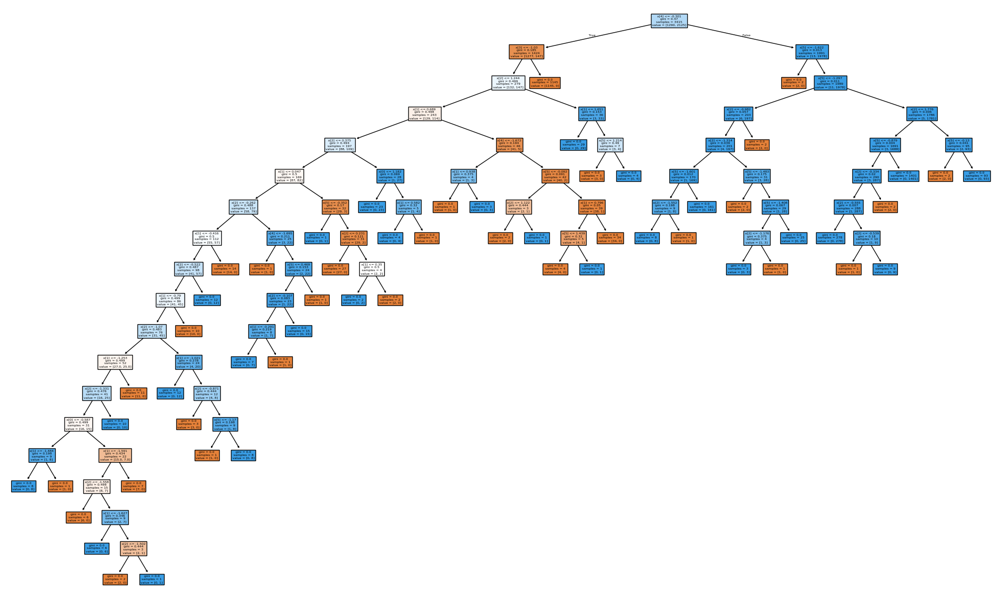

In [37]:
from sklearn import tree
plt.figure(figsize=(25,15))
tree.plot_tree(treeClassifier,filled=True)

In [38]:
treeClassifier2=DecisionTreeClassifier(max_depth=12)

In [39]:
treeClassifier2.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=12)

In [40]:
accuracy_score(y_test,treeClassifier2.predict(X_test))

0.9882903981264637

[Text(0.644375, 0.9615384615384616, 'x[4] <= -0.301\ngini = 0.47\nsamples = 3415\nvalue = [1290, 2125]'),
 Text(0.48875, 0.8846153846153846, 'x[3] <= -1.03\ngini = 0.185\nsamples = 1424\nvalue = [1277, 147]'),
 Text(0.5665625000000001, 0.9230769230769231, 'True  '),
 Text(0.46875, 0.8076923076923077, 'x[2] <= 1.244\ngini = 0.499\nsamples = 279\nvalue = [132, 147]'),
 Text(0.3775, 0.7307692307692307, 'x[1] <= 0.689\ngini = 0.498\nsamples = 243\nvalue = [129, 114]'),
 Text(0.285, 0.6538461538461539, 'x[2] <= 0.375\ngini = 0.494\nsamples = 197\nvalue = [88, 109]'),
 Text(0.23, 0.5769230769230769, 'x[1] <= 0.047\ngini = 0.5\nsamples = 169\nvalue = [87, 82]'),
 Text(0.18, 0.5, 'x[2] <= -0.262\ngini = 0.488\nsamples = 137\nvalue = [58, 79]'),
 Text(0.14, 0.4230769230769231, 'x[1] <= -0.416\ngini = 0.5\nsamples = 112\nvalue = [55, 57]'),
 Text(0.12, 0.34615384615384615, 'x[2] <= -0.522\ngini = 0.487\nsamples = 98\nvalue = [41, 57]'),
 Text(0.1, 0.2692307692307692, 'x[1] <= -0.79\ngini = 0.499

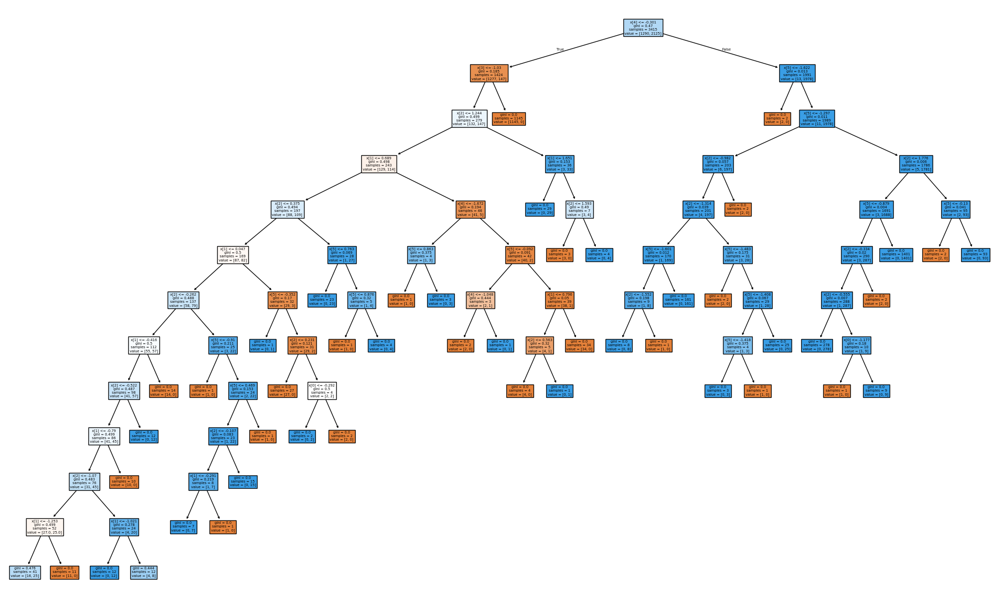

In [41]:
from sklearn import tree
plt.figure(figsize=(25,15))
tree.plot_tree(treeClassifier2,filled=True)

In [42]:
from sklearn.linear_model import LogisticRegression
LGClassifier=LogisticRegression()

In [43]:
LGClassifier.fit(X_train,y_train)

LogisticRegression()

In [44]:
accuracy_score(y_test,LGClassifier.predict(X_test))

0.927400468384075

In [45]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier()

In [46]:
rfc.fit(X_train,y_train)

RandomForestClassifier()

In [47]:
accuracy_score(y_test,rfc.predict(X_test))

0.9894613583138173

In [48]:
parameter={
    'criterion':['gini','entropy','log_loss'],
    'splitter':['best','random'],
    'max_depth':[12,13,14,15,16,17,18,19,20],
    'max_features':['auto', 'sqrt', 'log2']
}

In [49]:
from sklearn.model_selection import GridSearchCV

In [50]:
dtc=DecisionTreeClassifier()
cv=GridSearchCV(dtc,param_grid=parameter,cv=5,scoring='accuracy')

In [51]:
cv.fit(X_train,y_train)

C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
270 fits failed out of a total of 810.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
270 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py"

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [12, 13, 14, 15, 16, 17, 18, 19, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [52]:
cv.best_params_

{'criterion': 'gini',
 'max_depth': 13,
 'max_features': 'log2',
 'splitter': 'best'}

In [53]:
accuracy_score(y_test,cv.predict(X_test))

0.9754098360655737

In [54]:
print(classification_report(cv.predict(X_test),y_test))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97       338
           1       0.97      0.99      0.98       516

    accuracy                           0.98       854
   macro avg       0.98      0.97      0.97       854
weighted avg       0.98      0.98      0.98       854



In [55]:
print(classification_report(treeClassifier.predict(X_test),y_test))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       331
           1       0.98      1.00      0.99       523

    accuracy                           0.99       854
   macro avg       0.99      0.99      0.99       854
weighted avg       0.99      0.99      0.99       854



In [56]:
accuracy_score(y_train,treeClassifier.predict(X_train))

1.0

In [57]:
accuracy_score(y_train,cv.predict(X_train))

0.9976573938506589

In [58]:
model=DecisionTreeClassifier(criterion='entropy',
 max_depth=7,
 max_features='log2',
 splitter='best')

In [59]:
model.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=7, max_features='log2')

In [60]:
accuracy_score(y_train,model.predict(X_train))

0.967203513909224

In [61]:
accuracy_score(y_test,model.predict(X_test))

0.949648711943794

In [62]:
print(classification_report(model.predict(X_test),y_test))

              precision    recall  f1-score   support

           0       0.95      0.92      0.93       332
           1       0.95      0.97      0.96       522

    accuracy                           0.95       854
   macro avg       0.95      0.94      0.95       854
weighted avg       0.95      0.95      0.95       854



In [63]:
from xgboost import XGBClassifier

In [64]:
xgbc=XGBClassifier(gamma=10)

In [65]:
xgbc.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=10, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [66]:
accuracy_score(y_test,xgbc.predict(X_test))

0.9800936768149883

In [67]:
accuracy_score(y_train,xgbc.predict(X_train))

0.9792093704245973

In [68]:
params={
    "learning_rate": [0.05,0.1,0.15,0.2,0.25,0.3],
    "max_depth": [3,4,5,6,7,8,9,10,11,12,13,14,15],
    "min_child_weight": [1,3,5,7],
    "gamma": [0.1,0.2,0.3,0.4,0.5],
    "colsample_bytree": [0.3,0.4,0.5,0.6,0.7]
}

In [69]:
xgbc2=XGBClassifier()

In [70]:
from sklearn.model_selection import RandomizedSearchCV
rsxg=RandomizedSearchCV(xgbc2,param_distributions=params,n_iter=5,scoring="roc_auc",n_jobs=-1,cv=5,verbose=3)

In [71]:
rsxg.fit(X_train,y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_iter=5, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.3, 0.4, 0.5, 0.6,
                                                             0.7],
                                        'gamma': [0.1, 0.2, 0.3, 0.4, 0.5],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2,
                                                          0.25, 0.3],
                                        'max_depth': [3, 4, 5, 6, 7, 8, 9, 10,
                                                      11, 12, 13, 14, 15],
                                        'min_child_weight': [1, 3, 5, 7]},
                   scoring='roc_auc', verbose=3)

In [72]:
rsxg.best_params_

{'min_child_weight': 5,
 'max_depth': 14,
 'learning_rate': 0.1,
 'gamma': 0.2,
 'colsample_bytree': 0.7}

In [73]:
model2=XGBClassifier(min_child_weight=3,
 max_depth=8,
 learning_rate=0.2,
 gamma=0.5,
 colsample_bytree=0.6)

In [74]:
model2.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.5, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [75]:
accuracy_score(y_test,model2.predict(X_test))

0.9871194379391101

In [76]:
accuracy_score(y_train,model2.predict(X_train))

0.9938506588579795

In [77]:
from joblib import dump

In [78]:
dump(model,'./../savedModels/model.joblib')

['./../savedModels/model.joblib']

In [79]:
dump(scaler,'./../savedModels/scaler.joblib')

['./../savedModels/scaler.joblib']